In [10]:
# Script to run custom TFLite model on test images to detect objects
# Source: https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py

# Import packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Define function for inferencing with TFLite model and displaying results

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  # Grab filenames of all images in test folder
  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # Load the label map into memory
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  # Load the Tensorflow Lite model into memory
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # Get model details
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # Randomly select test images
  images_to_test = random.sample(images, num_test_images)

  # Loop over every image and perform detection
  for image_path in images_to_test:

      # Load image and resize to expected shape [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      # Perform the actual detection by running the model with the image as input
      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      # Retrieve detection results
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

      detections = []

      # Loop over all detections and draw detection box if confidence is above minimum threshold
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # Get bounding box coordinates and draw box
              # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              # Draw label
              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])


      # All the results have been drawn on the image, now display the image
      if txt_only == False: # "text_only" controls whether we want to display the image results or just save them in .txt files
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()

      # Save detection results in .txt files (for calculating mAP)
      elif txt_only == True:

        # Get filenames and paths
        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # Write results to text file
        # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

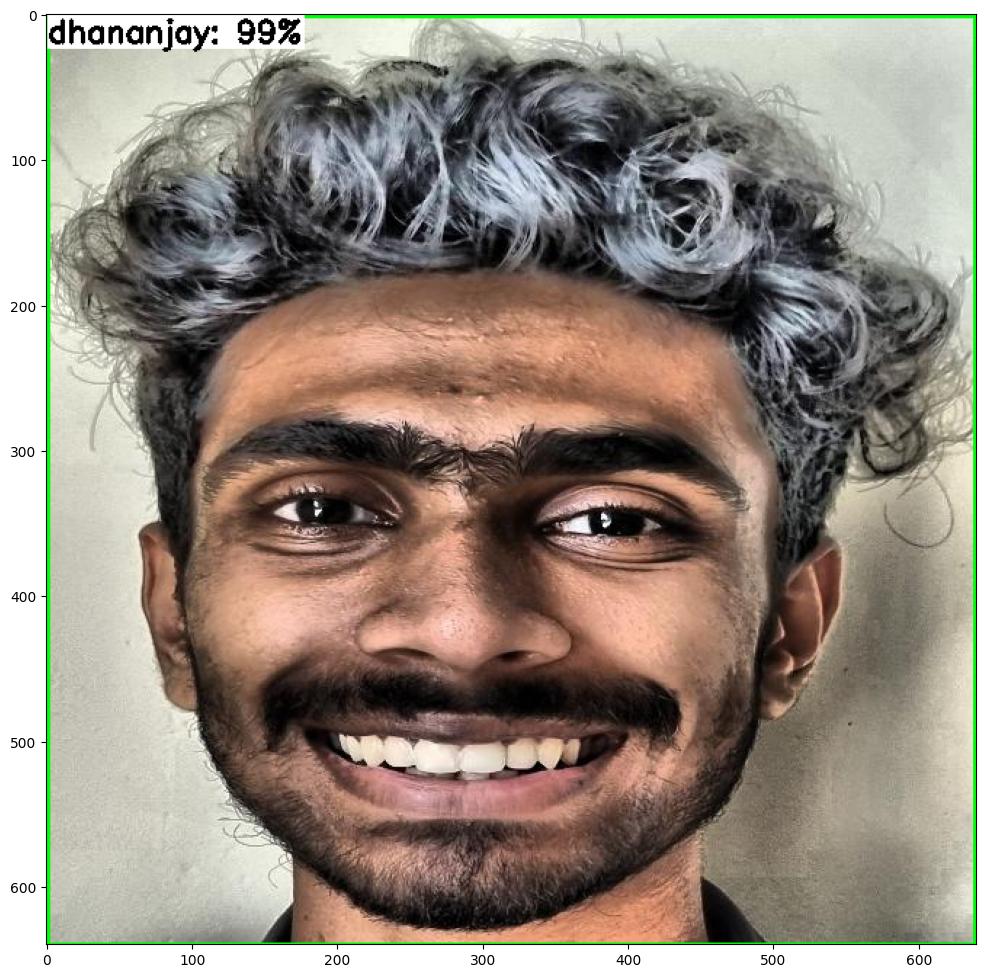

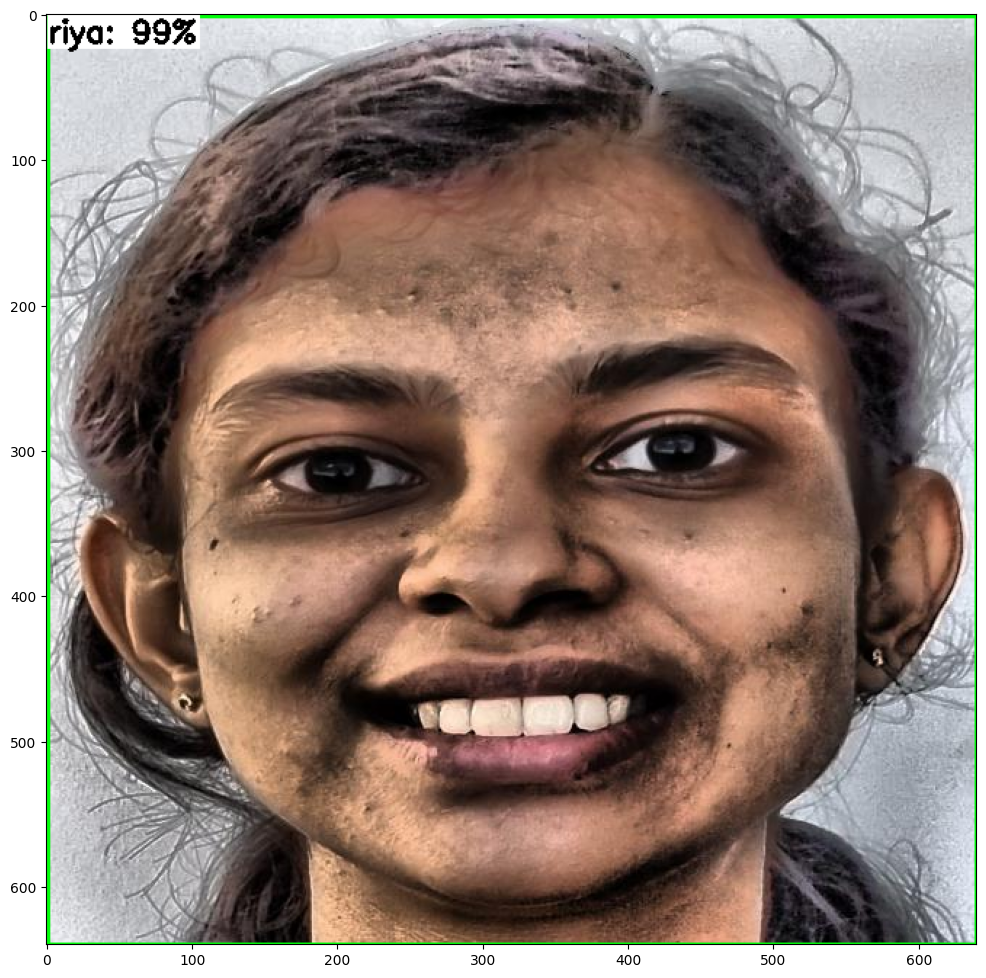

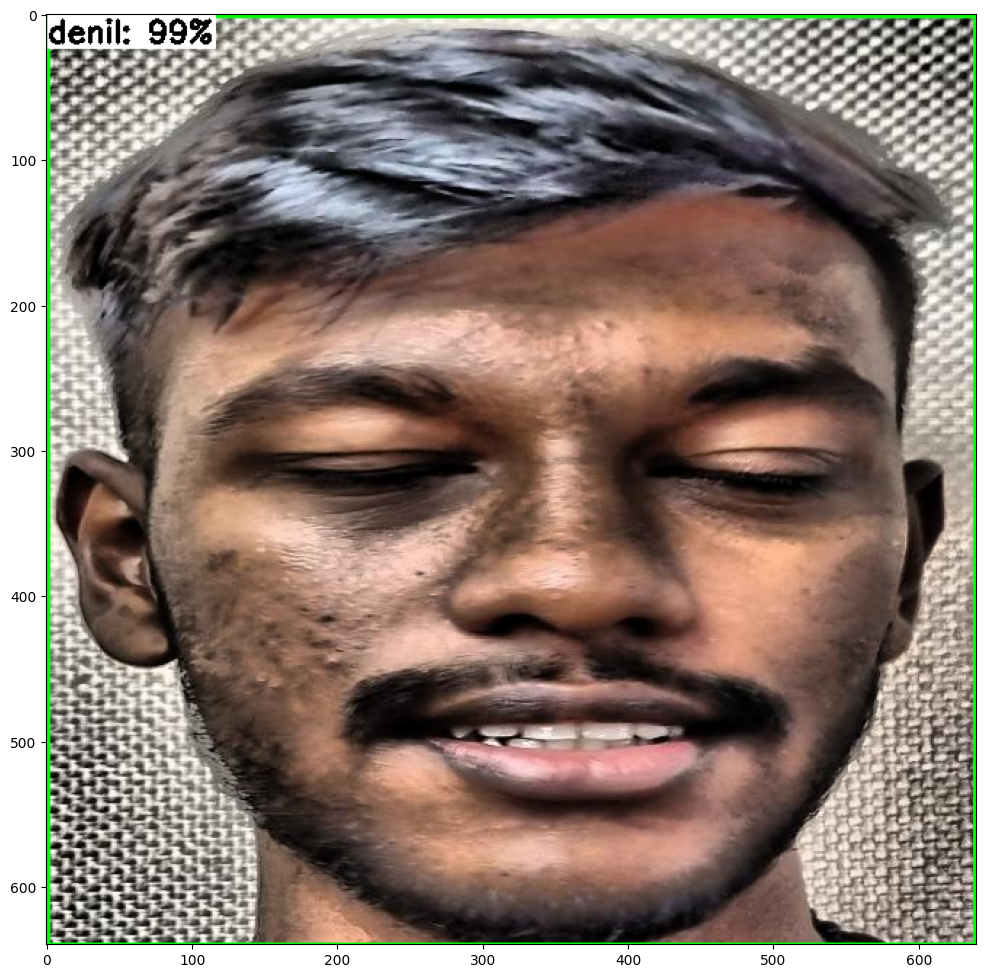

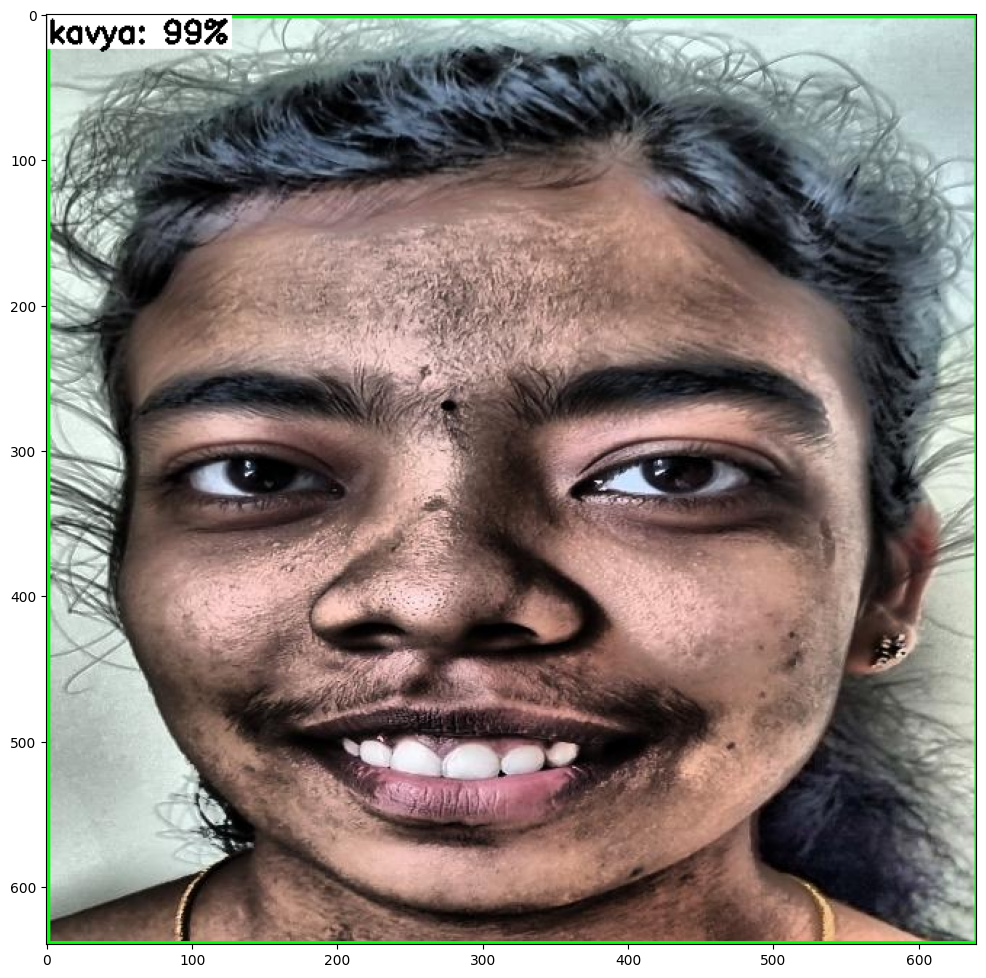

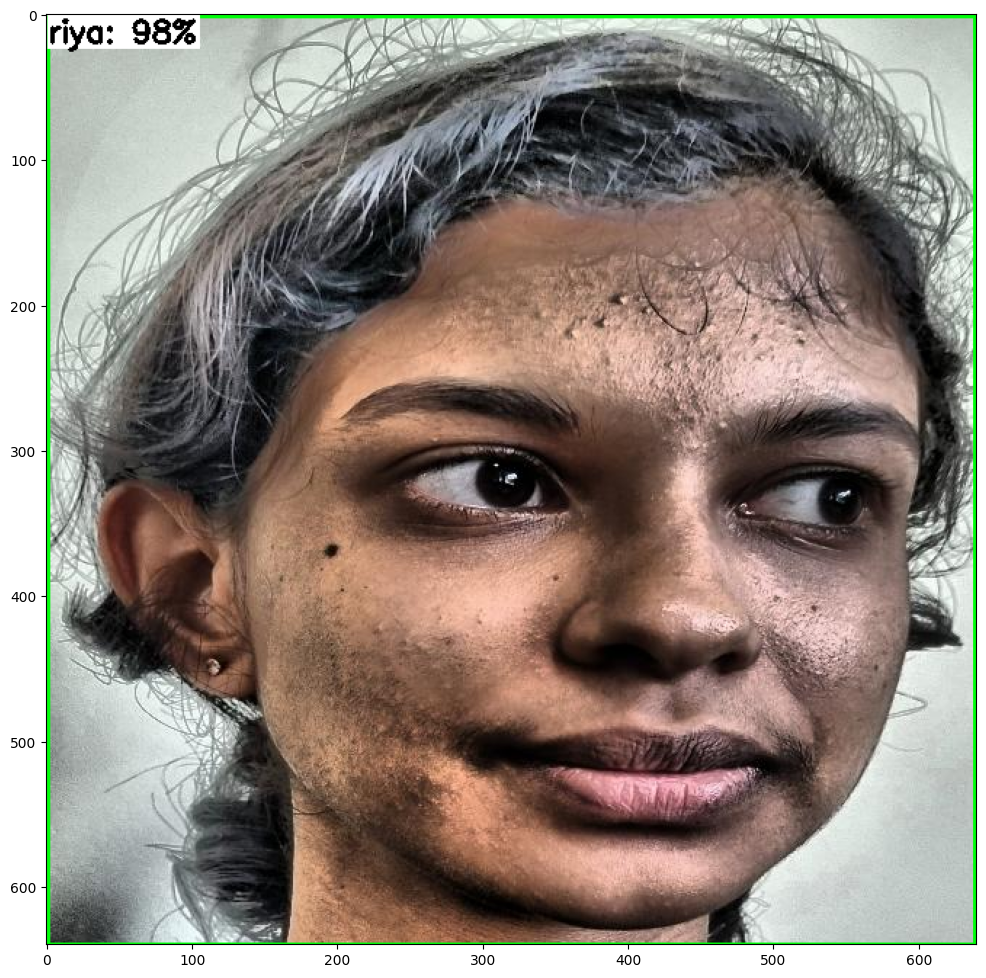

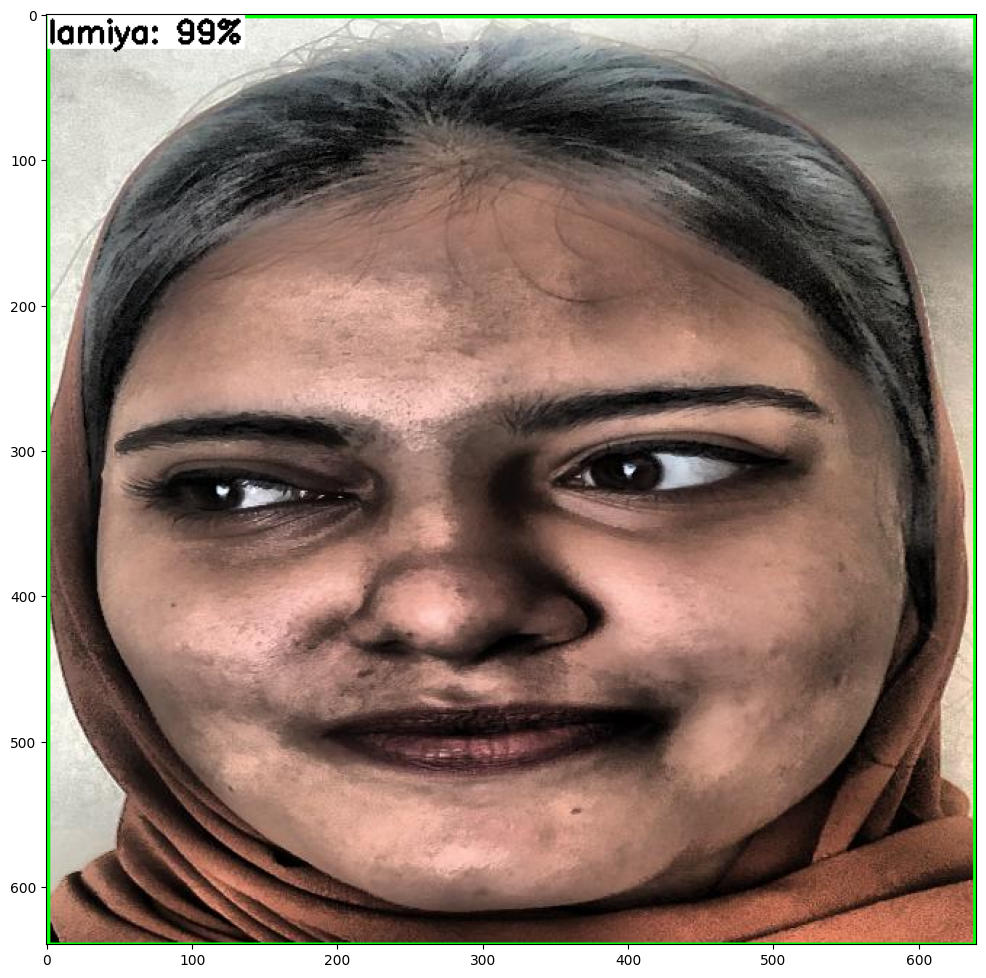

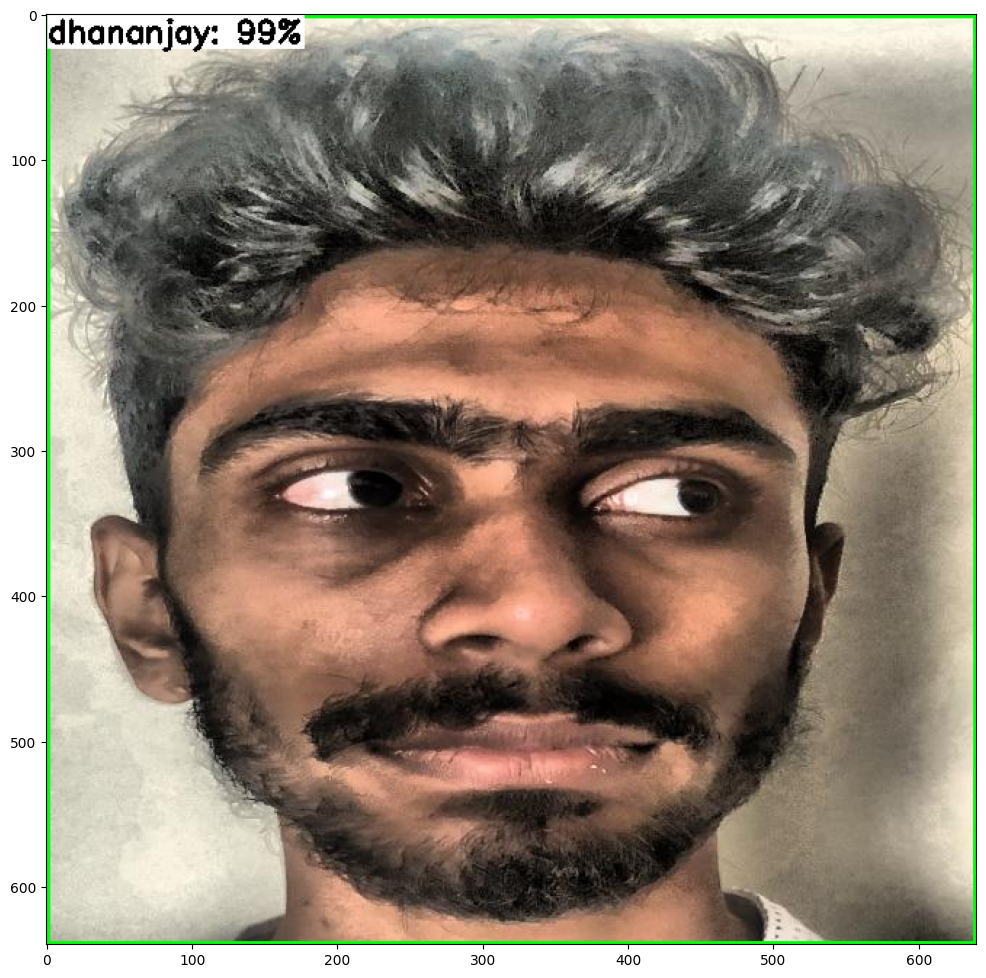

In [11]:
# Set up variables for running user's model
PATH_TO_IMAGES='test2/'   # Path to test images folder
PATH_TO_MODEL='detect_metadata.tflite'#detect_quantization.tflite'   # Path to .tflite model file
PATH_TO_LABELS='labelmap.txt'   # Path to labelmap.txt file
min_conf_threshold=0.5   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 7   # Number of images to run adetection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

In [4]:
import cv2
import numpy as np
from tensorflow.lite.python.interpreter import Interpreter

def tflite_detect_webcam(modelpath, lblpath, min_conf=0.5, savepath='/content/results', txt_only=False):

    cap = cv2.VideoCapture(0)  # Initialize webcam capture

    if not cap.isOpened():  # Check if the webcam is opened successfully
        print("Error: Could not open webcam.")
        return

    with open(lblpath, 'r') as f:  # Load label map into memory
        labels = [line.strip() for line in f.readlines()]

    interpreter = Interpreter(model_path=modelpath)  # Load TensorFlow Lite model
    interpreter.allocate_tensors()

    input_details = interpreter.get_input_details()  # Get model details
    output_details = interpreter.get_output_details()
    height = input_details[0]['shape'][1]
    width = input_details[0]['shape'][2]
    float_input = (input_details[0]['dtype'] == np.float32)
    input_mean = 127.5
    input_std = 127.5

    # Load pre-trained Haar Cascade classifier for face detection
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

    while True:  # Continuously capture frames
        ret, frame = cap.read()  # Capture frame-by-frame

        if not ret:  # Check if frame is captured
            print("Error: Could not read frame.")
            break

        # Convert frame to grayscale for face detection
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the frame
        faces = face_cascade.detectMultiScale(gray_frame, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

        for (x, y, w, h) in faces:  # Loop through detected faces
            face_roi = frame[y:y+h, x:x+w]  # Region of interest (face)
            
            # Resize face region to fit model input size
            face_resized = cv2.resize(face_roi, (width, height))

            # Preprocess input data for the model
            input_data = np.expand_dims(face_resized, axis=0)
            if float_input:
                input_data = (np.float32(input_data) - input_mean) / input_std

            interpreter.set_tensor(input_details[0]['index'], input_data)
            interpreter.invoke()

            boxes = interpreter.get_tensor(output_details[1]['index'])[0]
            classes = interpreter.get_tensor(output_details[3]['index'])[0]
            scores = interpreter.get_tensor(output_details[0]['index'])[0]

            for i in range(len(scores)):  # Loop through object detection results
                if ((scores[i] > min_conf) and (scores[i] <= 1.0)):
                    ymin = int(max(1, (boxes[i][0] * h)))
                    xmin = int(max(1, (boxes[i][1] * w)))
                    ymax = int(min(h, (boxes[i][2] * h)))
                    xmax = int(min(w, (boxes[i][3] * w)))

                    cv2.rectangle(face_roi, (xmin, ymin), (xmax, ymax), (10, 255, 0), 2)

                    object_name = labels[int(classes[i])]
                    label = '%s: %d%%' % (object_name, int(scores[i]*100))
                    labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)
                    label_ymin = max(ymin, labelSize[1] + 10)
                    cv2.rectangle(face_roi, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED)
                    cv2.putText(face_roi, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2)

        cv2.imshow('Object Detection', frame)  # Display frame

        if cv2.waitKey(1) & 0xFF == ord('q'):  # Press 'q' to exit
            break

    cap.release()  # Release webcam
    cv2.destroyAllWindows()  # Close OpenCV windows


In [8]:

model_path = 'detect_metadata.tflite'
label_path = 'labelmap.txt'

# Call the function to perform object detection using the webcam
tflite_detect_webcam(model_path, label_path, min_conf=0.5,txt_only=False)

In [1]:
import cv2
import numpy as np
from tensorflow.lite.python.interpreter import Interpreter

def tflite_detect_webcam(modelpath, lblpath, min_conf=0.5, savepath='/content/results', txt_only=False):

    cap = cv2.VideoCapture(0)  # Initialize webcam capture

    if not cap.isOpened():  # Check if the webcam is opened successfully
        print("Error: Could not open webcam.")
        return

    with open(lblpath, 'r') as f:  # Load label map into memory
        labels = [line.strip() for line in f.readlines()]

    interpreter = Interpreter(model_path=modelpath)  # Load TensorFlow Lite model
    interpreter.allocate_tensors()

    input_details = interpreter.get_input_details()  # Get model details
    output_details = interpreter.get_output_details()
    height = input_details[0]['shape'][1]
    width = input_details[0]['shape'][2]
    float_input = (input_details[0]['dtype'] == np.float32)
    input_mean = 127.5
    input_std = 127.5

    # Load pre-trained Haar Cascade classifier for face detection
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

    max_width = 320  # Set the desired maximum width

    while True:  # Continuously capture frames
        ret, frame = cap.read()  # Capture frame-by-frame

        if not ret:  # Check if frame is captured
            print("Error: Could not read frame.")
            break

        # Convert frame to grayscale for face detection
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the frame
        faces = face_cascade.detectMultiScale(gray_frame, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

        for (x, y, w, h) in faces:  # Loop through detected faces
            face_roi = frame[y:y+h, x:x+w]  # Region of interest (face)

            # Resize face region maintaining aspect ratio
            aspect_ratio = face_roi.shape[1] / face_roi.shape[0]
            new_width = int(max_width * aspect_ratio)
            face_resized = cv2.resize(face_roi, (new_width, max_width))

            # Pad if necessary to achieve the desired width
            pad_left = (max_width - new_width) // 2
            pad_right = max_width - new_width - pad_left
            face_resized = cv2.copyMakeBorder(face_resized, 0, 0, pad_left, pad_right, cv2.BORDER_CONSTANT, value=(0, 0, 0))

            # Resize to fit model input size
            face_resized = cv2.resize(face_resized, (width, height))

            # Preprocess input data for the model
            input_data = np.expand_dims(face_resized, axis=0)
            if float_input:
                input_data = (np.float32(input_data) - input_mean) / input_std

            interpreter.set_tensor(input_details[0]['index'], input_data)
            interpreter.invoke()

            boxes = interpreter.get_tensor(output_details[1]['index'])[0]
            classes = interpreter.get_tensor(output_details[3]['index'])[0]
            scores = interpreter.get_tensor(output_details[0]['index'])[0]

            for i in range(len(scores)):  # Loop through object detection results
                if ((scores[i] > min_conf) and (scores[i] <= 1.0)):
                    ymin = int(max(1, (boxes[i][0] * h)))
                    xmin = int(max(1, (boxes[i][1] * w)))
                    ymax = int(min(h, (boxes[i][2] * h)))
                    xmax = int(min(w, (boxes[i][3] * w)))

                    cv2.rectangle(face_roi, (xmin, ymin), (xmax, ymax), (10, 255, 0), 2)

                    object_name = labels[int(classes[i])]
                    label = '%s: %d%%' % (object_name, int(scores[i]*100))
                    labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)
                    label_ymin = max(ymin, labelSize[1] + 10)
                    cv2.rectangle(face_roi, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED)
                    cv2.putText(face_roi, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2)

        cv2.imshow('Object Detection', frame)  # Display frame

        if cv2.waitKey(1) & 0xFF == ord('q'):  # Press 'q' to exit
            break

    cap.release()  # Release webcam
    cv2.destroyAllWindows()  # Close OpenCV windows


In [10]:
# Replace 'model_path' and 'label_path' with the actual paths to your model and label files

model_path = 'detect_metadata.tflite'
label_path = 'labelmap.txt'

# Call the function to perform object detection using the webcam
tflite_detect_webcam(model_path, label_path, min_conf=0.5,txt_only=False)

In [6]:
import cv2
import numpy as np
from tensorflow.lite.python.interpreter import Interpreter
import pandas as pd
from datetime import datetime

def update_attendance(name, date):
    # Load the student attendance data
    attendance_df = pd.read_excel('students.xlsx')

    # Check if the name exists in the DataFrame
    if name in attendance_df['Name'].values:
        # Check if the date column exists and update attendance for the specific date
        if date in attendance_df.columns:
            attendance_df.loc[attendance_df['Name'] == name, date] = 'Present'
        else:
            # If the date column doesn't exist, create a new column for that date and update attendance
            attendance_df[date] = ''
            attendance_df.loc[attendance_df['Name'] == name, date] = 'Present'

        # Save the updated DataFrame back to the Excel file
        attendance_df.to_excel('students.xlsx', index=False)



def tflite_detect_webcam(modelpath, lblpath, min_conf=0.5, savepath='/content/results', txt_only=False):

    cap = cv2.VideoCapture(0)  # Initialize webcam capture

    if not cap.isOpened():  # Check if the webcam is opened successfully
        print("Error: Could not open webcam.")
        return

    with open(lblpath, 'r') as f:  # Load label map into memory
        labels = [line.strip() for line in f.readlines()]

    interpreter = Interpreter(model_path=modelpath)  # Load TensorFlow Lite model
    interpreter.allocate_tensors()

    input_details = interpreter.get_input_details()  # Get model details
    output_details = interpreter.get_output_details()
    height = input_details[0]['shape'][1]
    width = input_details[0]['shape'][2]
    float_input = (input_details[0]['dtype'] == np.float32)
    input_mean = 127.5
    input_std = 127.5

    # Load pre-trained Haar Cascade classifier for face detection
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

    max_width = 640  # Set the desired maximum width
    
    # Get the current date
    current_date = datetime.now().strftime("%Y-%m-%d")  # Format: YYYY-MM-DD

    while True:  # Continuously capture frames
        ret, frame = cap.read()  # Capture frame-by-frame

        if not ret:  # Check if frame is captured
            print("Error: Could not read frame.")
            break

        # Convert frame to grayscale for face detection
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Detect faces in the frame
        faces = face_cascade.detectMultiScale(gray_frame, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

        for (x, y, w, h) in faces:  # Loop through detected faces
            face_roi = frame[y:y+h, x:x+w]  # Region of interest (face)

            # Resize face region maintaining aspect ratio
            aspect_ratio = face_roi.shape[1] / face_roi.shape[0]
            new_width = int(max_width * aspect_ratio)
            face_resized = cv2.resize(face_roi, (new_width, max_width))

            # Pad if necessary to achieve the desired width
            pad_left = (max_width - new_width) // 2
            pad_right = max_width - new_width - pad_left
            face_resized = cv2.copyMakeBorder(face_resized, 0, 0, pad_left, pad_right, cv2.BORDER_CONSTANT, value=(0, 0, 0))

            # Resize to fit model input size
            face_resized = cv2.resize(face_resized, (width, height))

            # Preprocess input data for the model
            input_data = np.expand_dims(face_resized, axis=0)
            if float_input:
                input_data = (np.float32(input_data) - input_mean) / input_std

            interpreter.set_tensor(input_details[0]['index'], input_data)
            interpreter.invoke()

            boxes = interpreter.get_tensor(output_details[1]['index'])[0]
            classes = interpreter.get_tensor(output_details[3]['index'])[0]
            scores = interpreter.get_tensor(output_details[0]['index'])[0]

            for i in range(len(scores)):  # Loop through object detection results
                if ((scores[i] > min_conf) and (scores[i] <= 1.0)):
                    ymin = int(max(1, (boxes[i][0] * h)))
                    xmin = int(max(1, (boxes[i][1] * w)))
                    ymax = int(min(h, (boxes[i][2] * h)))
                    xmax = int(min(w, (boxes[i][3] * w)))

                    cv2.rectangle(face_roi, (xmin, ymin), (xmax, ymax), (10, 255, 0), 2)
                    
                    object_name = labels[int(classes[i])]
                    confidence = int(scores[i]*100)
                    label = '%s: %d%%' % (object_name, confidence)
                    labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2)
                    label_ymin = max(ymin, labelSize[1] + 10)
                    cv2.rectangle(face_roi, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED)
                    cv2.putText(face_roi, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2)

                    # Update attendance if the name is recognized
                    update_attendance(object_name, current_date)

                    
        cv2.imshow('Object Detection', frame)  # Display frame

        if cv2.waitKey(1) & 0xFF == ord('q'):  # Press 'q' to exit
            break

    cap.release()  # Release webcam
    cv2.destroyAllWindows()  # Close OpenCV windows



In [7]:
# Replace 'model_path' and 'label_path' with the actual paths to your model and label files

model_path = 'detect_metadata.tflite'
label_path = 'labelmap.txt'

# Call the function to perform object detection using the webcam
tflite_detect_webcam(model_path, label_path, min_conf=0.5,txt_only=False)